# STopover_visium sample code

## Load STopover & Prepare

In [1]:
import os

os.environ["CUDA_DEVICE_ORDER"] = "PCI_BUS_ID" # run on GPU
os.environ["CUDA_VISIBLE_DEVICES"]="0"

import scanpy as sc
import pandas as pd
import numpy as np
import seaborn as sns

In [2]:
from STopover import STopover_visium

In [3]:
outdir = './Results/Test'

### Read single-cell dataset (GSE131907) with cell type annotation in .obs as 'Cell_subtype'

##### Cells with 'Sample_Origin = tLung' were subsetted for analysis¶

In [4]:
sc_adata = sc.read_h5ad('sc_lung_cancer.h5ad')

In [5]:
sc_adata = sc_adata[sc_adata.obs['Sample_Origin']=='tLung']

In [6]:
sc_adata

View of AnnData object with n_obs × n_vars = 45149 × 29634
    obs: 'Barcode', 'Sample', 'Sample_Origin', 'Cell_type', 'Cell_type.refined', 'Cell_subtype'

##### Reassign Undetermined and NaN in 'Cell_subtype' into _ns subtype

In [7]:
sc_adata.obs['Cell_subtype'] = sc_adata.obs['Cell_subtype'].astype(object)
sc_adata.obs['Cell_type'] = sc_adata.obs['Cell_type'].astype(object)

sc_adata.obs['Cell_subtype'] = sc_adata.obs['Cell_subtype'].where(sc_adata.obs['Cell_subtype'].ne('Undetermined'), sc_adata.obs['Cell_type']+'_ns')
sc_adata.obs['Cell_subtype'] = sc_adata.obs['Cell_subtype'].fillna(sc_adata.obs['Cell_type']+'_ns')

In [8]:
sc_adata.obs

,Barcode,Sample,Sample_Origin,Cell_type,Cell_type.refined,Cell_subtype
AAACCTGAGACGACGT_LUNG_T09,AAACCTGAGACGACGT,LUNG_T09,tLung,Myeloid cells,Myeloid cells,CD1c+ DCs
AAACCTGAGACGACGT_LUNG_T34,AAACCTGAGACGACGT,LUNG_T34,tLung,B lymphocytes,B lymphocytes,Follicular B cells
AAACCTGAGACGCTTT_LUNG_T18,AAACCTGAGACGCTTT,LUNG_T18,tLung,Epithelial cells,Epithelial cells,tS2
AAACCTGAGACTGTAA_LUNG_T34,AAACCTGAGACTGTAA,LUNG_T34,tLung,Epithelial cells,Epithelial cells,tS2
AAACCTGAGATATGCA_LUNG_T25,AAACCTGAGATATGCA,LUNG_T25,tLung,T lymphocytes,T/NK cells,CD4+ Th
...,...,...,...,...,...,...
TTTGTCATCTCACATT_LUNG_T31,TTTGTCATCTCACATT,LUNG_T31,tLung,T lymphocytes,T/NK cells,CD8+/CD4+ Mixed Th
TTTGTCATCTGCGACG_LUNG_T31,TTTGTCATCTGCGACG,LUNG_T31,tLung,Fibroblasts,NaN,Fibroblasts_ns
TTTGTCATCTTGCCGT_LUNG_T30,TTTGTCATCTTGCCGT,LUNG_T30,tLung,Epithelial cells,Epithelial cells,tS1
TTTGTCATCTTTACAC_LUNG_T25,TTTGTCATCTTTACAC,LUNG_T25,tLung,B lymphocytes,B lymphocytes,Follicular B cells


### Read 10X-formatted Visium dataset

In [ ]:
sp_adata = sc.read_visium('~/sp_data')

In [17]:
sp_adata.var_names_make_unique()

### Run CellDART for cell type deconvolution

#### Installation of CellDART

In [ ]:
import sys
!{sys.executable} -m pip install git+https://github.com/mexchy1000/CellDART.git

#### Run CellDART

In [ ]:
from CellDART.pred_cellf_celldart import pred_cellf_celldart

celltype='Cell_subtype'

spatial_final = pred_cellf_celldart(adata_sp=sp_adata, adata_sc=sc_adata, count_from_raw = False,
                                    gpu=True, celltype=celltype, num_markers=20,
                                    nmix=10, npseudo=5*sp_adata.shape[0],
                                    alpha=1, alpha_lr=5, batch_size=512,  
                                    emb_dim=64, n_iterations=3000, init_train_epoch=10,  
                                    outdir='./Results/Test', return_anndata=True)

In [15]:
spatial_final.obs

,in_tissue,array_row,array_col,Stalk-like ECs_cellf,Lymphatic ECs_cellf,mo-Mac_cellf,NK cells_ns_cellf,Follicular B cells_cellf,CD1c+ DCs_cellf,Fibroblasts_ns_cellf,...,CD4+ Th_cellf,Endothelial cells_ns_cellf,Cytotoxic CD8+ T_cellf,GC B cells in the LZ_cellf,B lymphocytes_ns_cellf,Exhausted CD8+ T_cellf,Plasma cells_cellf,MALT B cells_cellf,MAST_cellf,Mesothelial cells_cellf
AAACAGCTTTCAGAAG-1,1,43,9,0.001958,2.926315e-06,0.002540,0.002426,0.159886,0.003287,0.000774,...,0.116510,0.000152,0.032124,0.000355,0.000792,0.048205,0.009755,0.037080,0.141230,0.000283
AAACAGGGTCTATATT-1,1,47,13,0.002782,3.557666e-06,0.006629,0.003312,0.121940,0.003416,0.000857,...,0.191321,0.000108,0.015263,0.000433,0.000708,0.057963,0.006988,0.031052,0.115669,0.000144
AAACCGGGTAGGTACC-1,1,42,28,0.002800,2.342734e-06,0.006679,0.002908,0.140179,0.010549,0.000772,...,0.200058,0.000170,0.017220,0.000653,0.000838,0.041521,0.006767,0.031685,0.078410,0.000372
AAACCGTTCGTCCAGG-1,1,52,42,0.000295,1.262986e-05,0.000378,0.000121,0.000410,0.001893,0.006960,...,0.000172,0.001210,0.000263,0.000183,0.000031,0.000200,0.000645,0.028839,0.000327,0.000103
AAACCTCATGAAGTTG-1,1,37,19,0.000389,2.368220e-07,0.011298,0.002841,0.235437,0.000808,0.000056,...,0.148056,0.000008,0.033999,0.000087,0.000229,0.030295,0.003791,0.010803,0.138439,0.000013
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTGTTCAGTGTGCTAC-1,1,24,64,0.003357,8.923344e-05,0.003503,0.000371,0.002923,0.008601,0.020229,...,0.004524,0.002907,0.003039,0.000187,0.000407,0.003056,0.199268,0.483119,0.003247,0.000884
TTGTTGTGTGTCAAGA-1,1,31,77,0.004236,4.161010e-04,0.068310,0.003602,0.059139,0.021573,0.014600,...,0.027856,0.006689,0.031168,0.000756,0.003416,0.014240,0.084371,0.086574,0.020243,0.003947
TTGTTTCACATCCAGG-1,1,58,42,0.001195,3.446257e-05,0.000540,0.000158,0.001975,0.003026,0.014238,...,0.000650,0.002762,0.000828,0.000317,0.000133,0.000476,0.002804,0.057648,0.000853,0.000414
TTGTTTCATTAGTCTA-1,1,60,30,0.000249,9.231262e-06,0.003592,0.002292,0.013773,0.005519,0.018709,...,0.002450,0.001161,0.004938,0.000242,0.000327,0.005240,0.000428,0.027833,0.002063,0.000522


#### Remove _cellf in the end of column names

In [16]:
spatial_final.obs.columns = [i[:-6] if i.endswith('_cellf') else i for i in spatial_final.obs.columns]

## Topological similarity analysis

In [17]:
cell_types = spatial_final.obs.columns[3:-1]
cell_types

Index(['Stalk-like ECs', 'Lymphatic ECs', 'mo-Mac', 'NK cells_ns',
       'Follicular B cells', 'CD1c+ DCs', 'Fibroblasts_ns', 'Activated DCs',
       'CD141+ DCs', 'tS2', 'Myeloid cells_ns', 'tS1', 'EPCs',
       'CD207+CD1a+ LCs', 'Naive CD4+ T', 'Myofibroblasts', 'tS3',
       'Naive CD8+ T', 'Tumor ECs', 'Alveolar Mac', 'Tip-like ECs',
       'Epithelial cells_ns', 'COL13A1+ matrix FBs', 'Pleural Mac',
       'Exhausted Tfh', 'CD8 low T', 'Monocytes', 'Treg', 'CD163+CD14+ DCs',
       'CD8+/CD4+ Mixed Th', 'GC B cells in the DZ', 'Smooth muscle cells',
       'COL14A1+ matrix FBs', 'T lymphocytes_ns', 'pDCs', 'Pericytes', 'NK',
       'CD4+ Th', 'Endothelial cells_ns', 'Cytotoxic CD8+ T',
       'GC B cells in the LZ', 'B lymphocytes_ns', 'Exhausted CD8+ T',
       'Plasma cells', 'MALT B cells', 'MAST'],
      dtype='object')

#### Create list of cell type pairs

In [18]:
cell_pairs = pd.DataFrame([(j,k) for i,j in enumerate(cell_types) for k in cell_types[i+1:]])
cell_pairs

,0,1
0,Stalk-like ECs,Lymphatic ECs
1,Stalk-like ECs,mo-Mac
2,Stalk-like ECs,NK cells_ns
3,Stalk-like ECs,Follicular B cells
4,Stalk-like ECs,CD1c+ DCs
...,...,...
1030,Exhausted CD8+ T,MALT B cells
1031,Exhausted CD8+ T,MAST
1032,Plasma cells,MALT B cells
1033,Plasma cells,MAST


### 1. Extract colocalized regions between cell types

#### Visualize spatial map of cell types

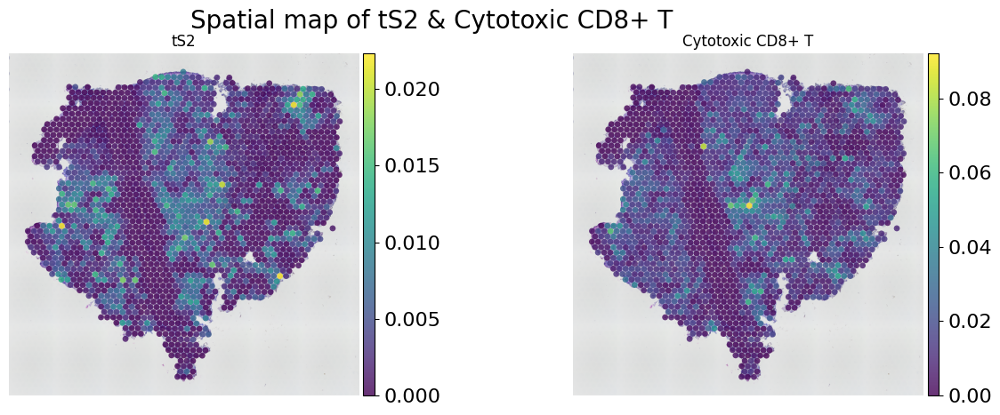

In [21]:
import matplotlib.pyplot as plt
testcells = ['tS2','Cytotoxic CD8+ T']
plt.rcParams.update(plt.rcParamsDefault)
plt.rcParams["figure.figsize"] = (15,5)
plt.rcParams['ytick.labelsize'] = 16
plt.rcParams["legend.framealpha"] = 0.2

fig, axs = plt.subplots(1, 2)
  
for visnum in range(len(testcells)):
    sc.pl.spatial(spatial_final, img_key='hires', color=testcells[visnum], vmin=0,
                  palette='Set1', size=1.5, alpha = 0.8, alpha_img = 1,
                  ax = axs[visnum], show = False)
    axs[visnum].set_title(testcells[visnum], fontsize=12)
    axs[visnum].axis('off')

plt.suptitle('Spatial map of tS2 & Cytotoxic CD8+ T', fontsize=20)
plt.savefig(os.path.join(outdir,'Spatial_lung_CellDART_CD8_celltypes.png'), dpi=200)
plt.show()

#### Extract colocalization patterns btw cell types

In [22]:
spatial_final_mod = STopover_visium(sp_adata=spatial_final, lognorm=True,
                                    min_size=20, fwhm=2.5, thres_per=30, 
                                    save_path=outdir)
    
spatial_final_mod.topological_similarity(feat_pairs=cell_pairs, J_result_name='result')

End of data preparation
Elapsed time: 0.04 seconds 
Calculation for adjacency matrix and mask


  0%|          | 0/1 [00:00<?, ?it/s]

Calculation for connected components for each feature


  0%|          | 0/46 [00:00<?, ?it/s]

Calculation for composite jaccard indexes between feature pairs


  0%|          | 0/1035 [00:00<?, ?it/s]

End of the whole process: 8.75 seconds


#### Extract dataframe for jaccard similarity index (J_comp)

In [23]:
df_mod = spatial_final_mod.uns['J_result_0']
df_mod['min_size'], df_mod['fwhm'], df_mod['percent'] = 20, 2.5, 30

#### Save the dataframe for J_comp

In [24]:
df_mod.to_csv(os.path.join(outdir, 'jaccard_composite_celltype.csv'), sep = ',', header=True, index=False)

#### Save the STopover_visium object

In [25]:
spatial_final_mod.save_connected_loc_data(save_format='h5ad', filename = 'sp_visium_celltype')  

#### Load topology result and visualize top interacting cell types (for percentage)

In [26]:
df = pd.read_csv(os.path.join(outdir, 'jaccard_composite_celltype.csv'))

In [27]:
df

,group,Feat_1,Feat_2,Avg_1,Avg_2,J_comp,min_size,fwhm,percent
0,0,Stalk-like ECs,Lymphatic ECs,0.003199,0.000058,0.232337,20,2.5,30
1,0,Stalk-like ECs,mo-Mac,0.003199,0.009364,0.127980,20,2.5,30
2,0,Stalk-like ECs,NK cells_ns,0.003199,0.004085,0.097973,20,2.5,30
3,0,Stalk-like ECs,Follicular B cells,0.003199,0.084842,0.109039,20,2.5,30
4,0,Stalk-like ECs,CD1c+ DCs,0.003199,0.020960,0.071429,20,2.5,30
...,...,...,...,...,...,...,...,...,...
1030,0,Exhausted CD8+ T,MALT B cells,0.020318,0.081674,0.070243,20,2.5,30
1031,0,Exhausted CD8+ T,MAST,0.020318,0.039229,0.442276,20,2.5,30
1032,0,Plasma cells,MALT B cells,0.016670,0.081674,0.503472,20,2.5,30
1033,0,Plasma cells,MAST,0.016670,0.039229,0.101083,20,2.5,30


#### Create barplot for the top overlapping immune cell types

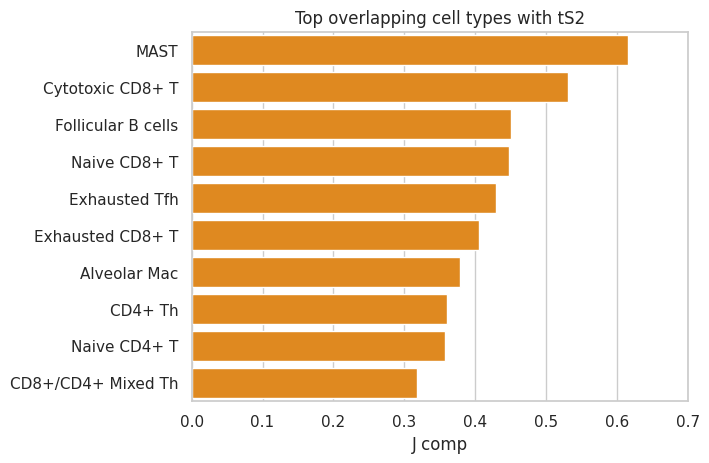

In [28]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.rcParams.update(plt.rcParamsDefault)
sns.set_theme(style="whitegrid")

min_size = 20
fwhm = 2.5
per = 30
immune_cell_types = ['mo-Mac', 'NK cells_ns','Follicular B cells', 'CD1c+ DCs', 'Activated DCs',
                     'CD141+ DCs', 'Myeloid cells_ns', 'EPCs','CD207+CD1a+ LCs', 'Naive CD4+ T', 
                     'Naive CD8+ T', 'Alveolar Mac', 'Pleural Mac','Exhausted Tfh', 'CD8 low T', 
                     'Monocytes', 'Treg', 'CD163+CD14+ DCs','CD8+/CD4+ Mixed Th', 'GC B cells in the DZ', 
                     'T lymphocytes_ns', 'pDCs', 'NK','CD4+ Th', 'Cytotoxic CD8+ T','GC B cells in the LZ', 
                     'B lymphocytes_ns', 'Exhausted CD8+ T','Plasma cells', 'MALT B cells', 'MAST']

# Initialize the matplotlib figure
df2_1 = df[(df['Feat_1']=='tS2') & (df['percent']==per)].copy()
df2_2 = df[(df['Feat_2']=='tS2') & (df['percent']==per)].copy()
df2_1['Jcomp'] = df2_1['J_comp']; df2_1['Feat'] = df2_1['Feat_2']
df2_2['Jcomp'] = df2_2['J_comp']; df2_2['Feat'] = df2_2['Feat_1']
df3 = pd.concat([df2_1, df2_2], axis=0)
df3 = df3[df3['Feat'].isin(immune_cell_types)].copy()
df3 = df3.sort_values(by='J_comp',ascending=False).head(10)

p = sns.barplot(x="J_comp", y="Feat", data=df3, label="Cell types", color="darkorange")

# Add a legend and informative axis label
p.set_title("Top overlapping cell types with tS2", fontsize=12)
p.set(xlim=(0, 0.7), ylabel="", xlabel="J comp")

plt.savefig(os.path.join(outdir,'Spatial_lung_Jmmx_tS2_'+str(min_size)+'_'+str(fwhm)+'_'+str(per)+'_total.png'), dpi=200)
plt.show()

#### Visualize colocalized regions of a cell type pair

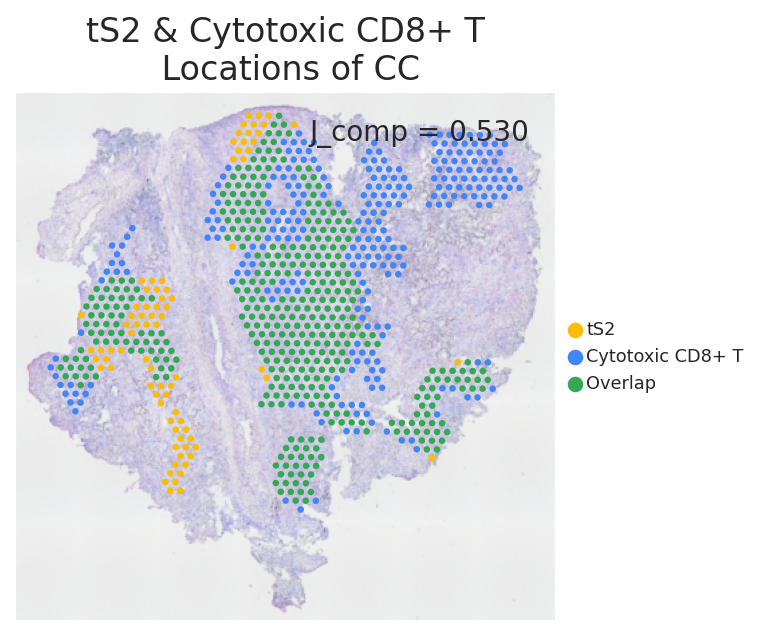

In [29]:
spatial_final_mod.vis_all_connected(spot_size=1, alpha_img=0.6, alpha=1,  
                                    feat_name_x='tS2', feat_name_y='Cytotoxic CD8+ T',  
                                    fig_size=(5,5), 
                                    batch_colname ='batch', batch_name='0', image_res='lowres',  
                                    adjust_image=True, border = 500,  
                                    title_fontsize=15, legend_fontsize=8, title = '\n Locations of CC', 
                                    return_axis=False, save=True, dpi=200)

#### Visualize top 8 regions with high local overlap

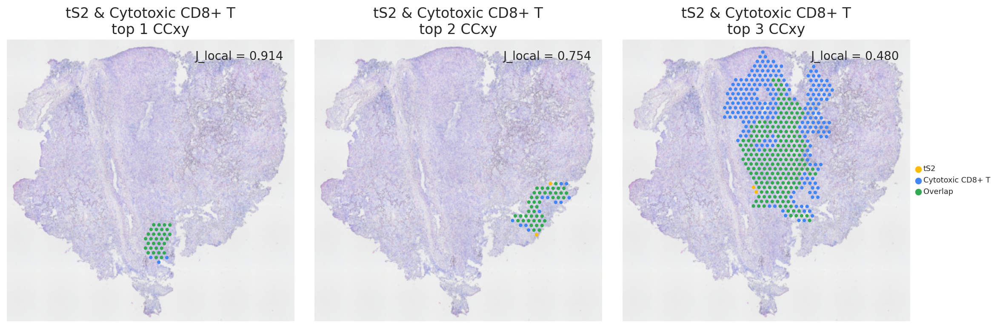

In [30]:
spatial_final_mod.vis_jaccard_top_n_pair(spot_size=1, alpha_img=0.6, alpha=1,  
                                         feat_name_x='tS2', feat_name_y='Cytotoxic CD8+ T',
                                         top_n = 3, ncol = 3,
                                         fig_size=(5,5), 
                                         batch_colname ='batch', batch_name='0', image_res='lowres',  
                                         adjust_image=True, border = 500,  
                                         title_fontsize=15, legend_fontsize=8, title = '', 
                                         return_axis=False, save=True, dpi=200)

#### Reset the CC location data saved in .obs

In [31]:
spatial_final_mod.J_result_reset()

### 2. Extract colocalized regions btw LR pairs (CellTalkDB)

#### Visualize feature map for LR pairs

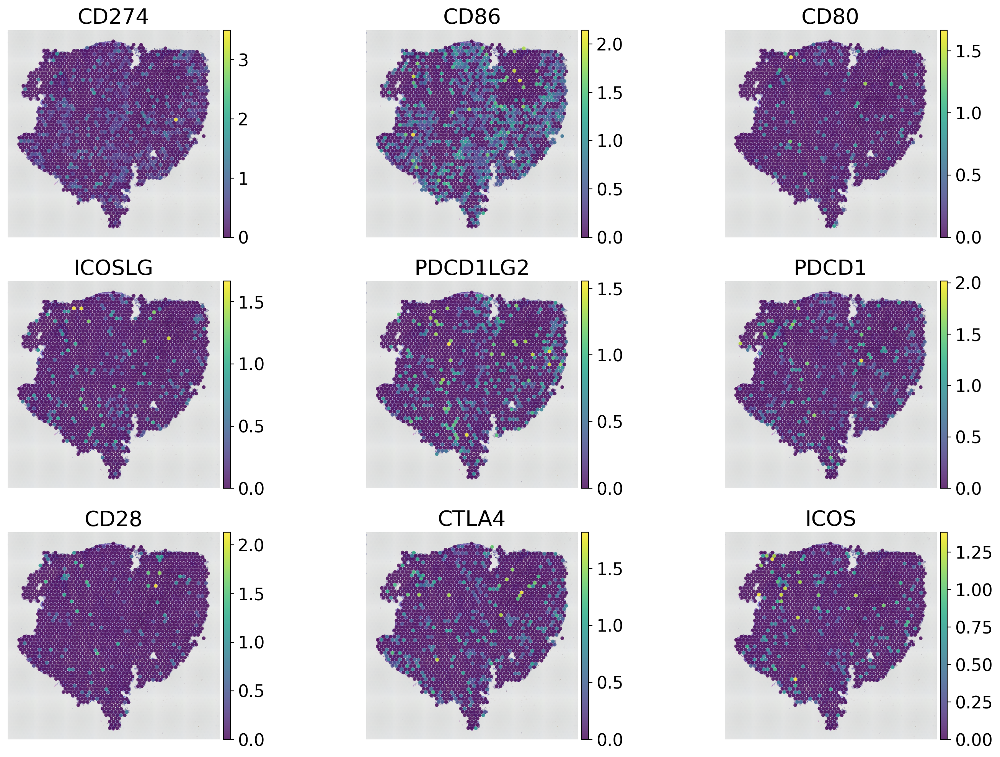

In [32]:
import matplotlib.pyplot as plt

testcells = ['CD274','CD86','CD80','ICOSLG','PDCD1LG2','PDCD1','CD28','CTLA4','ICOS']

plt.rcParams.update(plt.rcParamsDefault)
plt.rcParams["figure.figsize"] = (15,10)
plt.rcParams['ytick.labelsize'] = 16
plt.rcParams["legend.framealpha"] = 0.2

fig, axs = plt.subplots(3, 3, sharey=True, tight_layout=True)
    
for visnum in range(len(testcells)):
    sc.pl.spatial(spatial_final_mod, img_key='hires', color=testcells[visnum], vmin=0,
                  palette='Set1', size=1.5, alpha = 0.8, alpha_img = 1,
                  ax = axs[visnum//3][visnum%3], show = False)
    axs[visnum//3][visnum%3].set_title(testcells[visnum], fontsize=20)
    axs[visnum//3][visnum%3].axis('off')
plt.show()

#### Extract colocalization patterns between LR pairs

In [33]:
spatial_final_mod.topological_similarity(use_lr_db=True, lr_db_species='human', J_result_name='result')

Using CellTalkDB ligand-receptor dataset
End of data preparation
Elapsed time: 0.24 seconds 
Calculation for adjacency matrix and mask


  0%|          | 0/1 [00:00<?, ?it/s]

Calculation for connected components for each feature


  0%|          | 0/1335 [00:00<?, ?it/s]

Calculation for composite jaccard indexes between feature pairs


  0%|          | 0/2723 [00:00<?, ?it/s]

End of the whole process: 60.02 seconds


In [34]:
spatial_final_mod.save_path

'./Results/Test'

#### Save STopover object to the save_dir

In [35]:
spatial_final_mod.save_connected_loc_data(save_format='h5ad', filename = 'lr_pair_cc')

#### Extract dataframe for jaccard similarity index (J_comp)

In [36]:
df_mod = spatial_final_mod.uns['J_result_0']
df_mod['min_size'], df_mod['fwhm'], df_mod['percent'] = 20, 2.5, 30
df_mod.to_csv(os.path.join(outdir, 'top_sim_lung_cancer_lr_pair.csv'),
              sep = ',', header=True, index=False)

In [37]:
df2 = df_mod.sort_values(by=['J_comp'], ascending=[False])

In [38]:
df2

,group,Feat_1,Feat_2,Avg_1,Avg_2,J_comp,min_size,fwhm,percent
218,0,COL1A1,ITGA11,3.625226,0.613476,0.559740,20,2.5,30
1491,0,LAMB3,ITGA3,1.273909,1.782351,0.414673,20,2.5,30
1986,0,S100A4,ERBB2,2.206181,0.524911,0.412550,20,2.5,30
401,0,APOE,TREM2,3.039188,0.697495,0.396655,20,2.5,30
907,0,COL1A2,ITGA11,3.568304,0.613476,0.393293,20,2.5,30
...,...,...,...,...,...,...,...,...,...
536,0,CKLF,CCR4,0.486286,0.008052,0.000000,20,2.5,30
1016,0,F2,F2R,0.002137,0.882175,0.000000,20,2.5,30
1015,0,F2,GP1BB,0.002137,0.093218,0.000000,20,2.5,30
1006,0,CXCL11,ACKR1,0.390273,0.020872,0.000000,20,2.5,30


#### Import CellTalkDB database and select L-R of interest

In [39]:
lr_pairs = spatial_final_mod.return_celltalkdb('human')[['ligand_gene_symbol','receptor_gene_symbol']]
feat_pairs = lr_pairs[lr_pairs['ligand_gene_symbol'].isin(['CD86','CD80','ICOSLG','HLA-DR','CD274','PDCD1LG2','CD274'])].values

In [40]:
lr_pairs

,ligand_gene_symbol,receptor_gene_symbol
0,SEMA3F,PLXNA3
1,SEMA3F,PLXNA1
2,SEMA3F,NRP1
3,SEMA3F,NRP2
4,CX3CL1,CX3CR1
...,...,...
3393,CGA,GPR84
3394,ASIP,MC1R
3395,VEGFA,ITGB3
3396,APELA,APLNR


#### Extract LR pairs containing selected ligands

In [41]:
feat_pairs = lr_pairs[lr_pairs['ligand_gene_symbol'].isin(['CD86','CD80','ICOSLG','HLA-DR','CD274','PDCD1LG2','CD274'])].values

In [42]:
feat_pairs

array([['PDCD1LG2', 'PDCD2'],
       ['CD274', 'CD80'],
       ['CD86', 'CTLA4'],
       ['ICOSLG', 'ICOS'],
       ['CD86', 'CD28'],
       ['PDCD1LG2', 'PDCD1'],
       ['CD274', 'PDCD1']], dtype=object)

#### Visualize colocalized regions of LR pairs

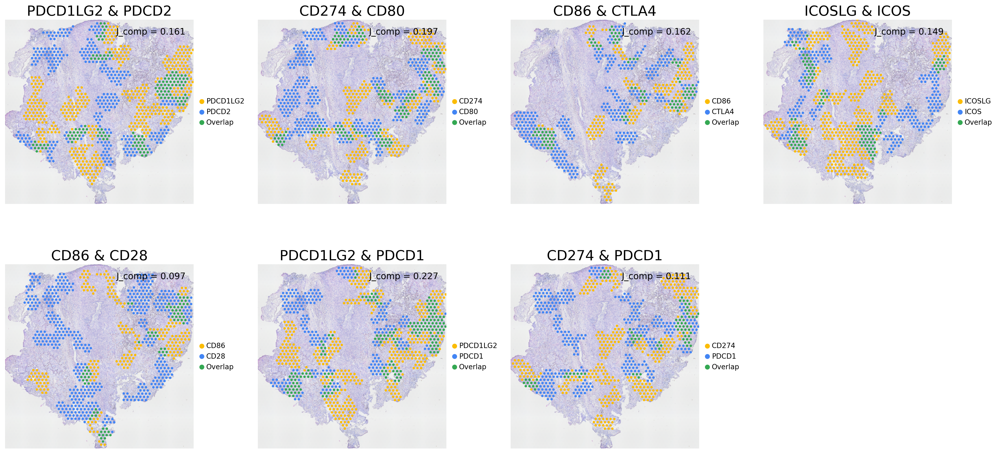

In [43]:
f, ax = plt.subplots(2, 4, figsize=(20, 10), sharey=False, tight_layout=True)
for index, (feat_x, feat_y) in enumerate(feat_pairs[:8]):
    spatial_final_mod.vis_all_connected(spot_size=1, 
                                        alpha_img=0.6, alpha=1,  
                                        feat_name_x=feat_x, feat_name_y=feat_y,
                                        fig_size=(5,5),
                                        adjust_image=True, border = 50,  
                                        title_fontsize=20, title = '', 
                                        return_axis=False, 
                                        axis=ax[index//4][index%4],
                                        save=False)
ax[1][3].axis('off')
plt.show()

#### Visualize top 8 regions with high local overlap (CD274 - PDCD1)

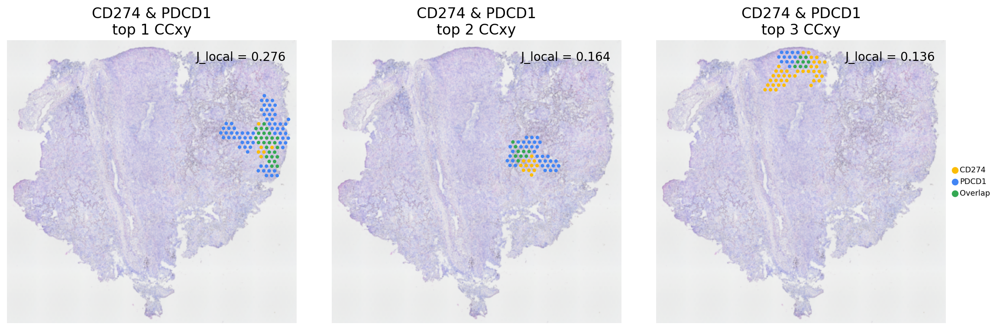

In [44]:
spatial_final_mod.vis_jaccard_top_n_pair(spot_size=1, alpha_img=0.6, alpha=1,  
                                         feat_name_x='CD274', feat_name_y='PDCD1',
                                         top_n = 3, ncol = 3,
                                         fig_size=(5,5), 
                                         batch_colname ='batch', batch_name='0', image_res='lowres',  
                                         adjust_image=True, border = 500,  
                                         title_fontsize=15, legend_fontsize=8, title = '', 
                                         return_axis=False, save=True, dpi=200)

### 3. Estimate cell type-specific colocalized regions btw LR pairs

#### Intersection between colocalized domain of tS2-Cytotoxic CD8 T & LR pairs

In [45]:
spatial_final_celltype = STopover_visium(sp_load_path=os.path.join(outdir,'sp_visium_celltype_adata.h5ad'),
                                         lognorm=False, save_path=outdir)
spatial_final_mod = STopover_visium(sp_load_path=os.path.join(outdir,'lr_pair_cc_adata.h5ad'),
                                    lognorm=False, save_path=outdir)
df_over = (spatial_final_celltype.obs['Comb_CC_tS2'] != 0) * (spatial_final_celltype.obs['Comb_CC_Cytotoxic CD8+ T'] != 0)
spatial_final_mod.obs['tS2_T'] = df_over.astype('category')
spatial_final_mod_over = spatial_final_mod[spatial_final_mod.obs['tS2_T'] != 0].copy()

adata_ts2_T = STopover_visium(sp_adata = spatial_final_mod_over, lognorm=False, save_path=outdir)

Anndata object is not provided: searching for files in 'sp_load_path'
Anndata object is not provided: searching for files in 'sp_load_path'


#### Visualize colocalized regions of a tS2-CD8 T-specific LR

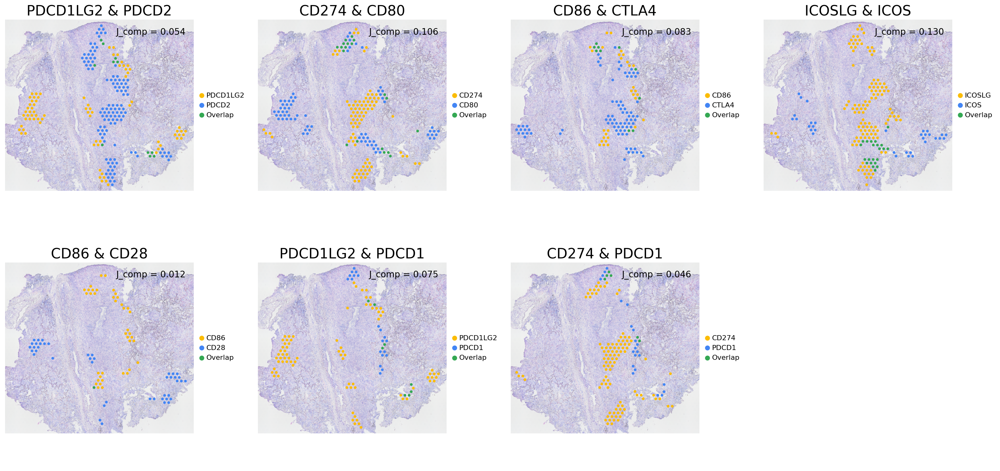

In [46]:
f, ax = plt.subplots(2, 4, figsize=(20, 10), sharey=False, tight_layout=True)
for index, (feat_x, feat_y) in enumerate(feat_pairs[:8]):
    adata_ts2_T.vis_all_connected(spot_size=1, 
                                  alpha_img=0.6, alpha=1,  
                                  feat_name_x=feat_x, feat_name_y=feat_y,
                                  fig_size=(5,5), image_res='hires',
                                  adjust_image=True, border = 500,  
                                  title_fontsize=20, title = '', 
                                  return_axis=False, 
                                  axis=ax[index//4][index%4],
                                  save=False)
ax[1][3].axis('off')
plt.show()